In [2]:

# Colab-friendly setup
!pip -q install fiftyone

from google.colab import drive
drive.mount('/content/drive')

import os
import shutil
import random
from pathlib import Path

import fiftyone as fo
import fiftyone.zoo as foz

print("FiftyOne version:", fo.__version__)


Mounted at /content/drive


/usr/local/lib/python3.12/dist-packages/glob2/fnmatch.py:141: SyntaxWarning: invalid escape sequence '\Z'
  return '(?ms)' + res + '\Z'


FiftyOne version: 1.11.0


In [3]:

# ===== Configuration =====
# Where to store negative images in Google Drive
BASE_DIR = Path("/content/drive/MyDrive/open_images_negatives")

# How many images to download per class (try small first to validate)
IMAGES_PER_CLASS = 100   # adjust as needed

# Try splits in this order until we find enough samples
SPLITS_ORDER = ["validation", "test", "train"]

# Negative example category → list of Open Images class names
# You can add/remove classes here.
CLASS_GROUPS = {
    "near_miss_tv": ["Television"],
    "near_miss_tablet_laptop": ["Laptop", "Tablet computer"],
    "signage_kiosk_pos": ["ATM", "Cash register"],
    "frames_mirrors_windows": ["Mirror", "Window", "Whiteboard", "Picture frame"],
    # Uncomment if you want these too (availability varies in Open Images)
    # "projectors_screens": ["Projector", "Screen"],
    # "smartphones": ["Mobile phone"],
}

# Target label to exclude entirely from negatives
EXCLUDE_LABEL = "Computer monitor"

# Ensure base folders exist
for group in CLASS_GROUPS:
    (BASE_DIR / group).mkdir(parents=True, exist_ok=True)

print("Output base:", BASE_DIR)


Output base: /content/drive/MyDrive/open_images_negatives


In [4]:

def load_subset_for_classes(classes, max_samples, splits=SPLITS_ORDER, seed=42):
    """
    Attempts to load a dataset subset from Open Images for the given classes
    across the given splits until images are found.
    """
    for split in splits:
        print(f"Trying split='{split}' for classes={classes}")
        try:
            ds = foz.load_zoo_dataset(
                "open-images",
                split=split,
                label_types=["detections"],
                classes=classes,
                only_matching=True,   # ensure images contain one of these classes
                max_samples=max_samples,
                seed=seed,
            )
            # Some splits/classes may return fewer than max_samples
            if len(ds) > 0:
                print(f"Loaded {len(ds)} samples from split='{split}'")
                return ds
        except Exception as e:
            print(f"Failed on split='{split}' with error: {e}")
    print(f"WARNING: No samples found for classes={classes} across splits={splits}")
    return None


def sample_contains_label(sample, label_field, label_name):
    """
    Checks whether a sample's detections include any instance of label_name.
    """
    dets = sample.get_field(label_field)
    if dets is None:
        return False
    for d in dets.detections:
        if d.label == label_name:
            return True
    return False


def get_detection_field_name(sample):
    """
    Returns the detection label field name (usually 'ground_truth') if present.
    """
    # FiftyOne zoo typically uses 'ground_truth'. Be defensive in case of future changes.
    if "ground_truth" in sample.field_names:
        return "ground_truth"
    # Fallback: find any Detections field
    for fname in sample.field_names:
        val = sample.get_field(fname)
        if val is not None and val.__class__.__name__ == "Detections":
            return fname
    return None


def export_negatives_without_label(dataset, exclude_label, export_dir, limit_per_class=None):
    """
    Exports images from `dataset` that do NOT contain `exclude_label`.
    Does not export annotations—only raw images—into `export_dir`.
    """
    exported = 0
    export_dir = Path(export_dir)
    export_dir.mkdir(parents=True, exist_ok=True)

    # Assume there's exactly one detection field; find it once
    label_field = None
    for s in dataset.take(1):
        label_field = get_detection_field_name(s)
        break
    if label_field is None:
        print("No detection labels found; exporting all as negatives.")
        label_field = "ground_truth"  # will act as 'absent'

    for sample in dataset:
        if sample_contains_label(sample, label_field, exclude_label):
            continue  # skip samples that have a Computer monitor

        src = Path(sample.filepath)
        # Avoid filename clashes: prefix with sample id
        dst_name = f"{sample.id}_{src.name}"
        dst_path = export_dir / dst_name

        # Some samples may share filepaths; avoid duplicates
        if dst_path.exists():
            continue

        shutil.copy2(src, dst_path)
        exported += 1

        if limit_per_class and exported >= limit_per_class:
            break

    return exported


In [6]:

import itertools
from collections import defaultdict

# --- helpers to introspect available classes in your FiftyOne install ---
from fiftyone.utils import openimages as fouo

# Pull the canonical Open Images (V7) boxable classes list
OI_CLASSES = set(fouo.get_classes(version="v7"))
print(f"Loaded {len(OI_CLASSES)} Open Images V7 classes")

def validate_class_names(requested):
    ok, bad = [], []
    for c in requested:
        if c in OI_CLASSES:
            ok.append(c)
        else:
            bad.append(c)
    return ok, bad

def load_subset_for_classes_v7(classes, max_samples, splits=SPLITS_ORDER, seed=42, strict=True):
    """
    Tries to load `open-images-v7` with the given classes. If `strict=True`,
    uses only_matching=True. If it fails to get any, it will try again with
    only_matching=False to be more permissive, and across the specified splits.
    """
    for split in splits:
        print(f"Trying split='{split}' for classes={classes} (strict={strict})")
        try:
            ds = foz.load_zoo_dataset(
                "open-images-v7",          # <-- important: v7 key
                split=split,
                label_types=["detections"],
                classes=classes,
                only_matching=strict,      # strict first, then relax
                max_samples=max_samples,
                seed=seed,
                shuffle=True,
            )
            if len(ds) > 0:
                print(f"Loaded {len(ds)} samples from split='{split}' (strict={strict})")
                return ds
        except Exception as e:
            print(f"Split='{split}' failed (strict={strict}) :: {e}")

    # If strict failed everywhere, try again with relaxed matching
    if strict:
        print("Retrying with strict=False (only_matching=False)")
        return load_subset_for_classes_v7(classes, max_samples, splits=splits, seed=seed, strict=False)

    print(f"WARNING: No samples found for classes={classes} across splits={splits}")
    return None

def export_negatives_without_label(dataset, exclude_label, export_dir, limit_per_class=None):
    exported = 0
    export_dir = Path(export_dir)
    export_dir.mkdir(parents=True, exist_ok=True)

    # Identify detection field
    label_field = None
    for s in dataset.take(1):
        label_field = get_detection_field_name(s)
        break
    if label_field is None:
        label_field = "ground_truth"

    for sample in dataset:
        if sample_contains_label(sample, label_field, exclude_label):
            continue  # skip monitors

        src = Path(sample.filepath)
        dst_name = f"{sample.id}_{src.name}"
        dst_path = export_dir / dst_name
        if dst_path.exists():
            continue

        shutil.copy2(src, dst_path)
        exported += 1
        if limit_per_class and exported >= limit_per_class:
            break

    return exported

summary = {}
detailed_issues = defaultdict(list)

for group_name, requested_classes in CLASS_GROUPS.items():
    print("\n" + "="*80)
    print(f"Processing group: {group_name} -> requested classes={requested_classes}")

    # 1) Validate class names
    ok_classes, bad_classes = validate_class_names(requested_classes)
    if bad_classes:
        issue = f"Invalid class names for Open Images V7: {bad_classes}"
        print(">> " + issue)
        detailed_issues[group_name].append(issue)

    if not ok_classes:
        summary[group_name] = {"downloaded": 0, "exported": 0, "note": "No valid classes"}
        continue

    # 2) Load with some slack to allow filtering (2x target)
    ds = load_subset_for_classes_v7(ok_classes, max_samples=IMAGES_PER_CLASS * 3)
    if ds is None or len(ds) == 0:
        note = "No samples found across splits (even with only_matching=False)"
        print(">> " + note)
        summary[group_name] = {"downloaded": 0, "exported": 0, "note": note}
        continue

    # 3) Export images that DO NOT contain monitors
    exported = export_negatives_without_label(
        ds,
        exclude_label=EXCLUDE_LABEL,
        export_dir=BASE_DIR / group_name,
        limit_per_class=IMAGES_PER_CLASS,
    )
    summary[group_name] = {"downloaded": len(ds), "exported": exported, "note": ""}

    # Clean up temporary dataset
    ds.delete()

print("\nSummary:")
for g, info in summary.items():
    print(f"- {g}: downloaded={info['downloaded']} exported={info['exported']} {info['note']}")

if detailed_issues:
    print("\nDiagnostics:")
    for g, issues in detailed_issues.items():
        print(f"- {g}:")
        for i in issues:
            print(f"   * {i}")


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv' to '/tmp/tmpc5qvz01i/metadata/classes.csv'


Loaded 601 Open Images V7 classes

Processing group: near_miss_tv -> requested classes=['Television']
Trying split='validation' for classes=['Television'] (strict=True)


INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/root/fiftyone/open-images-v7/validation' if necessary


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/validation/validation-images-with-rotation.csv' to '/root/fiftyone/open-images-v7/validation/metadata/image_ids.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv' to '/root/fiftyone/open-images-v7/validation/metadata/classes.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/bbox_labels_600_hierarchy.json' to '/tmp/tmpm42av540/metadata/hierarchy.json'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/validation-annotations-bbox.csv' to '/root/fiftyone/open-images-v7/validation/labels/detections.csv'


Only found 39 (<300) samples matching your requirements


INFO:fiftyone.utils.openimages:Downloading 39 images


 100% |█████████████████████| 39/39 [5.3s elapsed, 0s remaining, 7.9 files/s]       


INFO:eta.core.utils: 100% |█████████████████████| 39/39 [5.3s elapsed, 0s remaining, 7.9 files/s]       


Dataset info written to '/root/fiftyone/open-images-v7/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/open-images-v7/info.json'


Loading 'open-images-v7' split 'validation'


INFO:fiftyone.zoo.datasets:Loading 'open-images-v7' split 'validation'


 100% |███████████████████| 39/39 [121.8ms elapsed, 0s remaining, 320.3 samples/s] 


INFO:eta.core.utils: 100% |███████████████████| 39/39 [121.8ms elapsed, 0s remaining, 320.3 samples/s] 


Dataset 'open-images-v7-validation-300' created


INFO:fiftyone.zoo.datasets:Dataset 'open-images-v7-validation-300' created


Loaded 39 samples from split='validation' (strict=True)

Processing group: near_miss_tablet_laptop -> requested classes=['Laptop', 'Tablet computer']
Trying split='validation' for classes=['Laptop', 'Tablet computer'] (strict=True)


INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/root/fiftyone/open-images-v7/validation' if necessary


Only found 61 (<300) samples matching your requirements


INFO:fiftyone.utils.openimages:Downloading 61 images


 100% |█████████████████████| 61/61 [7.9s elapsed, 0s remaining, 8.6 files/s]       


INFO:eta.core.utils: 100% |█████████████████████| 61/61 [7.9s elapsed, 0s remaining, 8.6 files/s]       


Dataset info written to '/root/fiftyone/open-images-v7/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/open-images-v7/info.json'


Loading 'open-images-v7' split 'validation'


INFO:fiftyone.zoo.datasets:Loading 'open-images-v7' split 'validation'


 100% |███████████████████| 61/61 [189.0ms elapsed, 0s remaining, 332.3 samples/s] 


INFO:eta.core.utils: 100% |███████████████████| 61/61 [189.0ms elapsed, 0s remaining, 332.3 samples/s] 


Dataset 'open-images-v7-validation-300' created


INFO:fiftyone.zoo.datasets:Dataset 'open-images-v7-validation-300' created


Loaded 61 samples from split='validation' (strict=True)

Processing group: signage_kiosk_pos -> requested classes=['ATM', 'Cash register']
>> Invalid class names for Open Images V7: ['ATM', 'Cash register']

Processing group: frames_mirrors_windows -> requested classes=['Mirror', 'Window', 'Whiteboard', 'Picture frame']
Trying split='validation' for classes=['Mirror', 'Window', 'Whiteboard', 'Picture frame'] (strict=True)


INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/root/fiftyone/open-images-v7/validation' if necessary


Found 4 images, downloading the remaining 296


INFO:fiftyone.utils.openimages:Found 4 images, downloading the remaining 296


 100% |███████████████████| 296/296 [37.7s elapsed, 0s remaining, 7.8 files/s]      


INFO:eta.core.utils: 100% |███████████████████| 296/296 [37.7s elapsed, 0s remaining, 7.8 files/s]      


Dataset info written to '/root/fiftyone/open-images-v7/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/open-images-v7/info.json'


Loading 'open-images-v7' split 'validation'


INFO:fiftyone.zoo.datasets:Loading 'open-images-v7' split 'validation'


 100% |█████████████████| 300/300 [4.0s elapsed, 0s remaining, 102.6 samples/s]      


INFO:eta.core.utils: 100% |█████████████████| 300/300 [4.0s elapsed, 0s remaining, 102.6 samples/s]      


Dataset 'open-images-v7-validation-300' created


INFO:fiftyone.zoo.datasets:Dataset 'open-images-v7-validation-300' created


Loaded 300 samples from split='validation' (strict=True)

Summary:
- near_miss_tv: downloaded=39 exported=39 
- near_miss_tablet_laptop: downloaded=61 exported=61 
- signage_kiosk_pos: downloaded=0 exported=0 No valid classes
- frames_mirrors_windows: downloaded=300 exported=100 

Diagnostics:
- signage_kiosk_pos:
   * Invalid class names for Open Images V7: ['ATM', 'Cash register']



 ############################################################
Group: near_miss_tv
6937c36e386a70500f49318a_ff9d6b864d154460.jpg


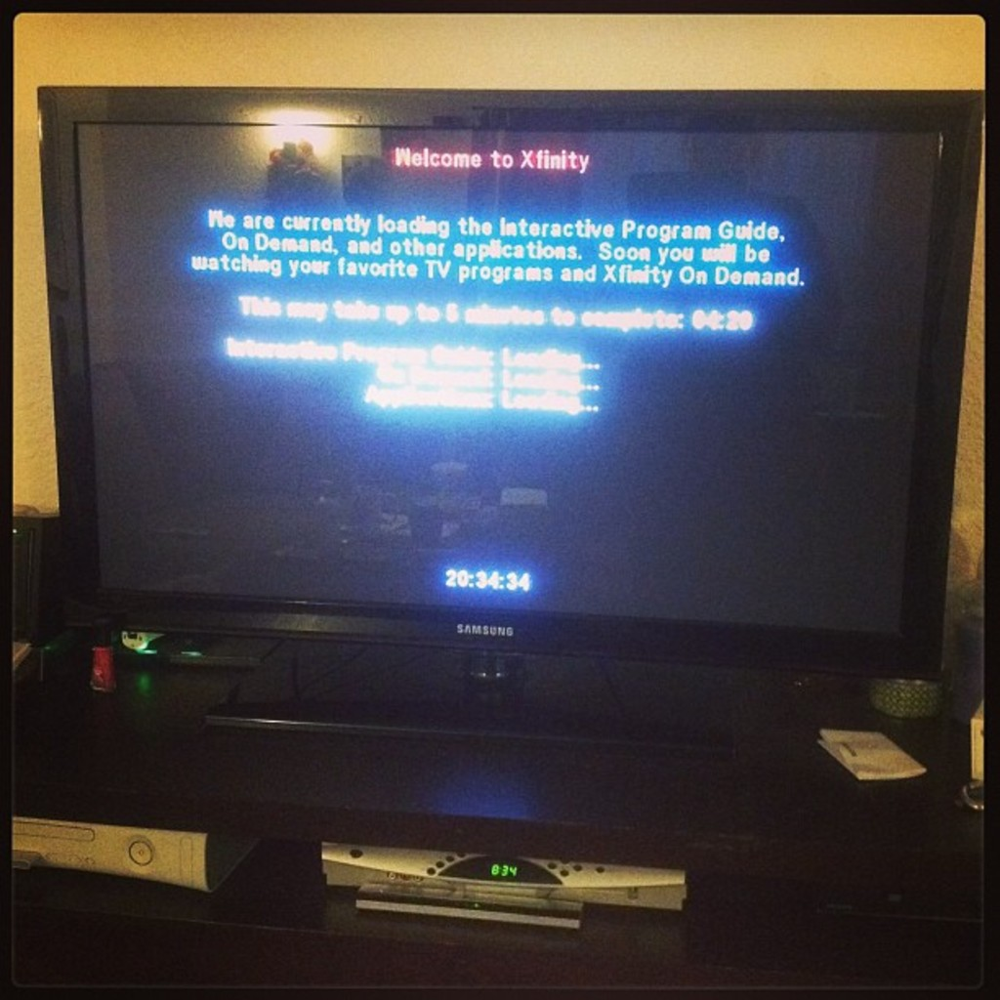

6937c36e386a70500f493187_d0267a07a2de3265.jpg


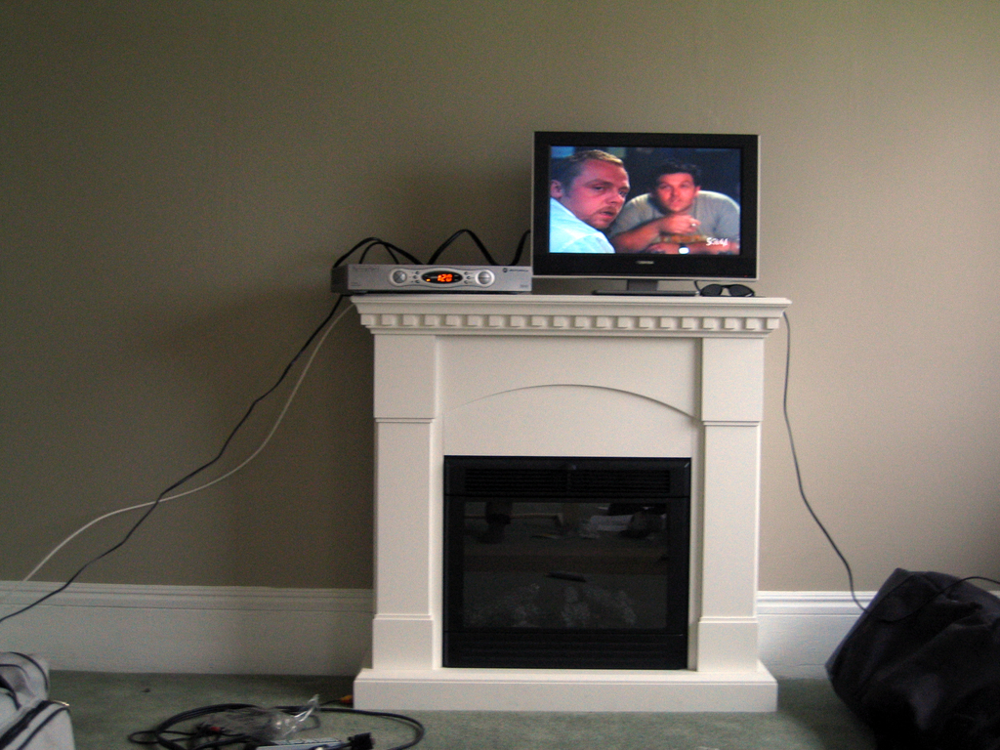

6937c36e386a70500f493154_d3ef31f7e41411e2.jpg


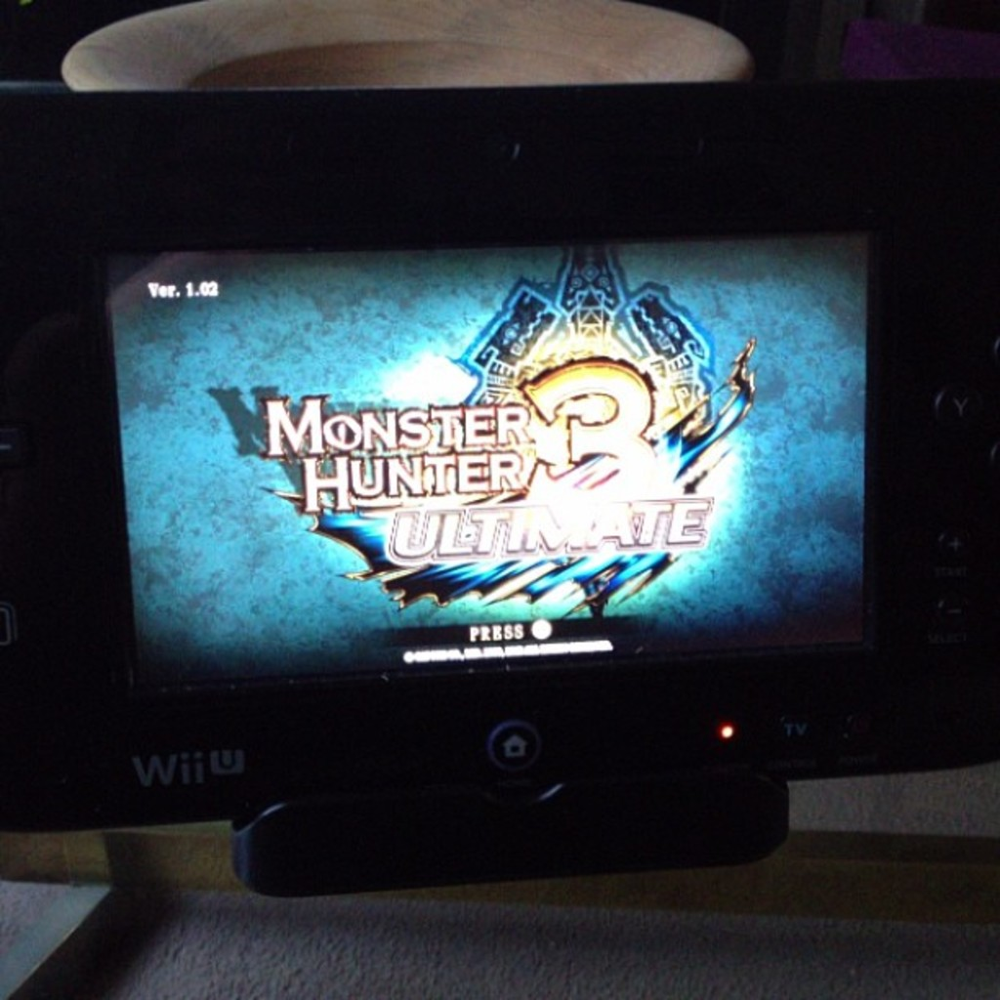


 ############################################################
Group: near_miss_tablet_laptop
6937c37a386a70500f49321a_fed5ef790d653fde.jpg


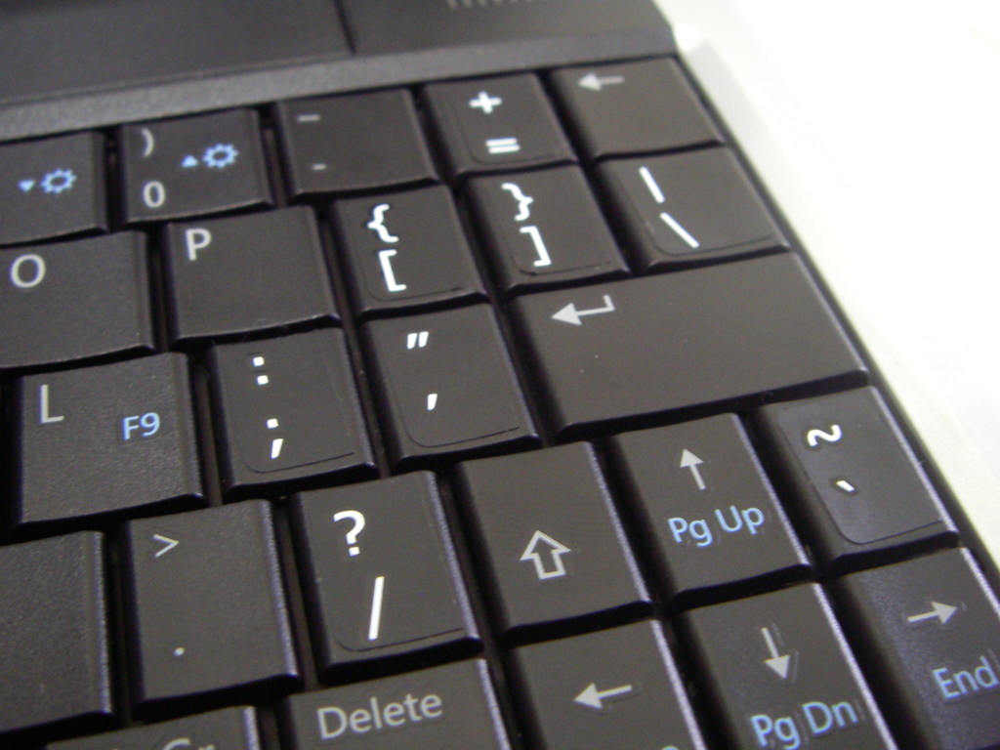

6937c37a386a70500f4931fc_dbcf1866b9c54b9c.jpg


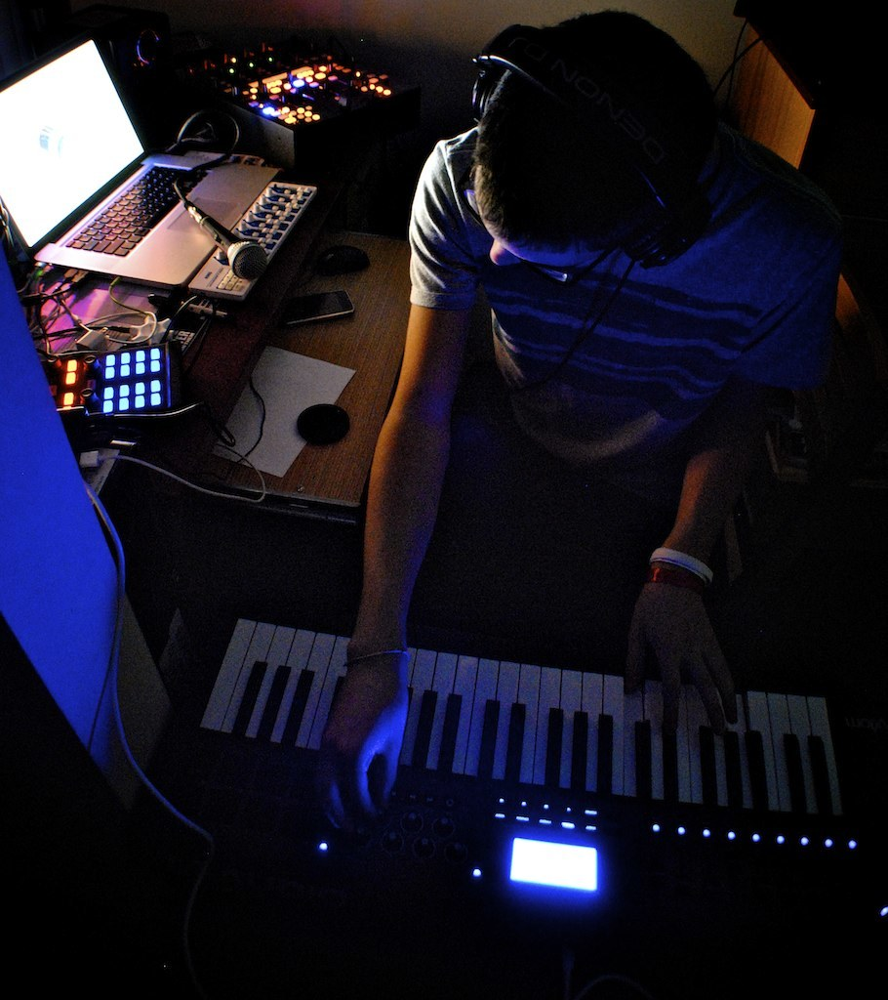

6937c37a386a70500f493218_4bd22ced20a97685.jpg


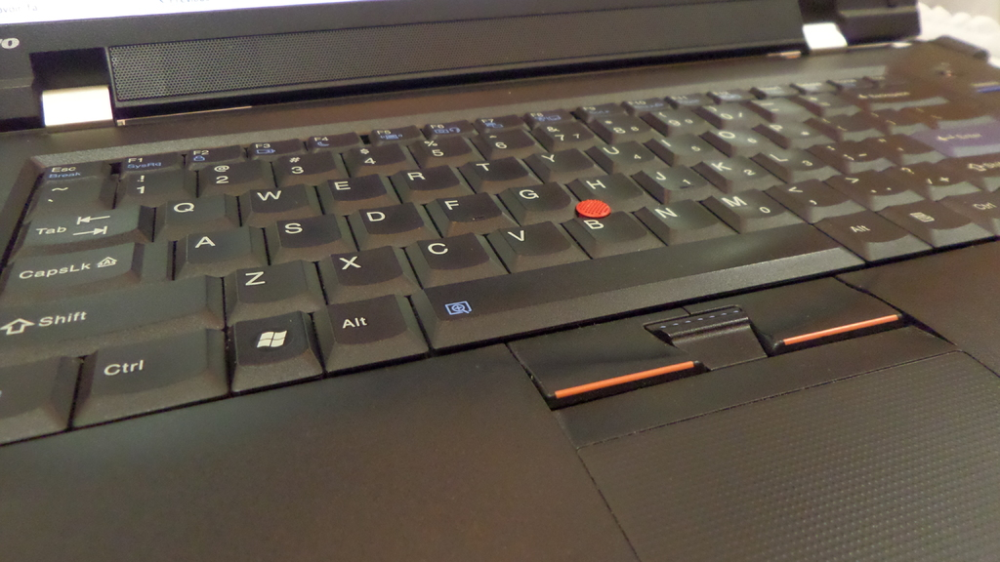


 ############################################################
Group: signage_kiosk_pos

 ############################################################
Group: frames_mirrors_windows
6937c3a5386a70500f493689_c274e026ac907eb9.jpg


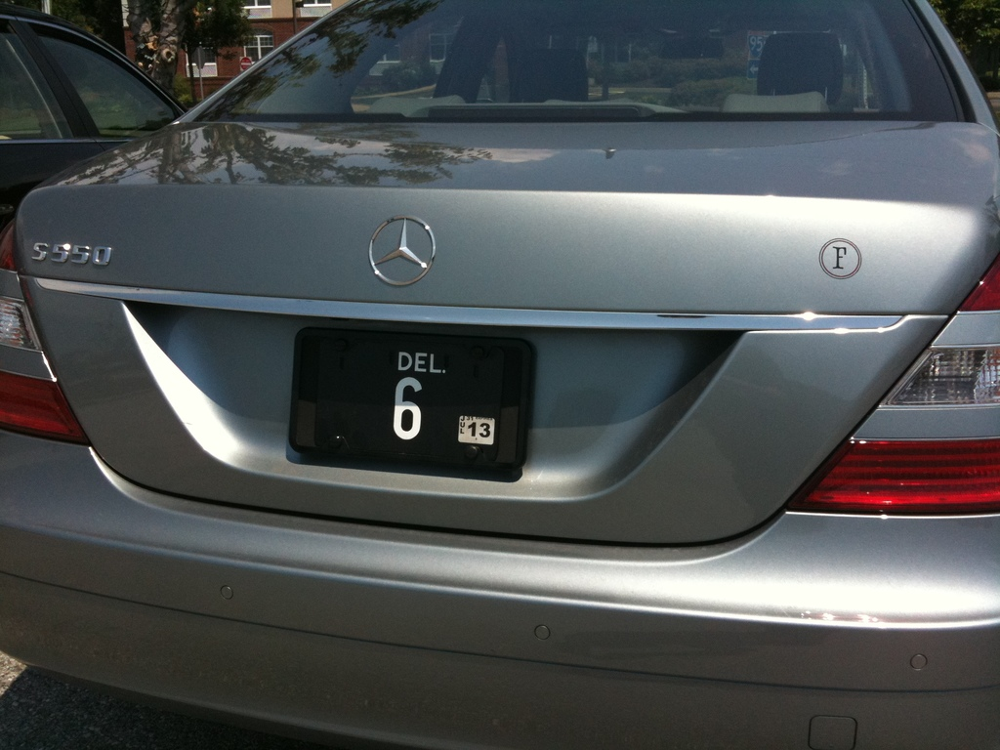

6937c3a5386a70500f493684_9901b6956ef5a73a.jpg


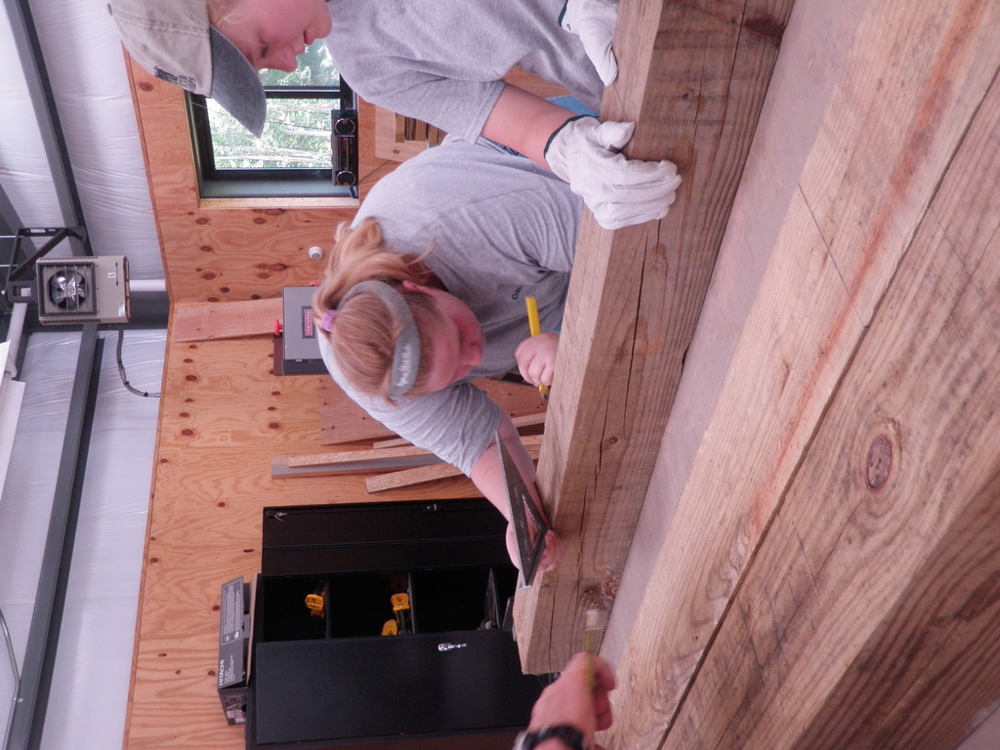

6937c3a6386a70500f49378f_30c1d5e4ba779260.jpg


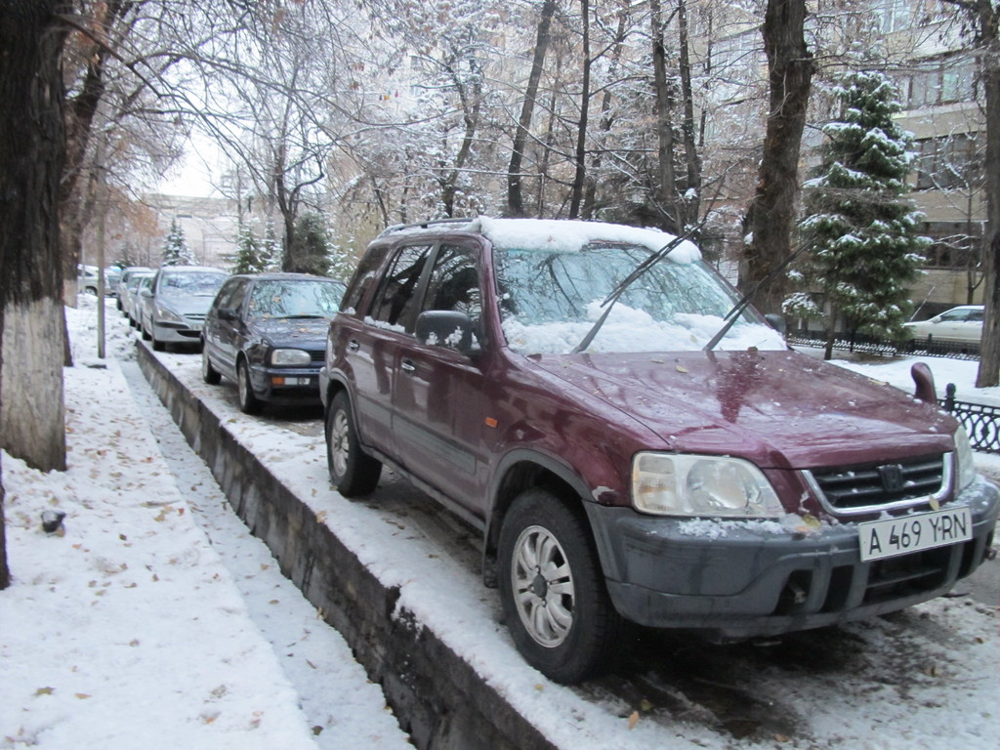

In [7]:

# Show a few random exported images from each group
from IPython.display import display
from PIL import Image

def show_samples(folder, n=5):
    folder = Path(folder)
    files = [p for p in folder.glob("*") if p.suffix.lower() in {".jpg", ".jpeg", ".png"}]
    random.shuffle(files)
    for p in files[:n]:
        print(p.name)
        display(Image.open(p))

for group_name in CLASS_GROUPS:
    print("\n", "#"*60)
    print("Group:", group_name)
    show_samples(BASE_DIR / group_name, n=3)


In [8]:

from pathlib import Path
import os, shutil, random

# Paths (update if needed)
DRIVE_BASE = Path("/content/drive/MyDrive")
NEG_SRC_BASE = DRIVE_BASE / "open_images_negatives"

# Output YOLO dataset root
YOLO_OUT = DRIVE_BASE / "yolo11_monitor_negatives"

# Train/val split ratios for your negatives
TRAIN_RATIO = 0.8
VAL_RATIO   = 0.2
TEST_RATIO  = 0.0  # set >0 if you want a test split

# Which image extensions to include
IMG_EXTS = {".jpg", ".jpeg", ".png"}

# Ensure output folders
for sub in ["images/train","images/val","images/test","labels/train","labels/val","labels/test"]:
    (YOLO_OUT / sub).mkdir(parents=True, exist_ok=True)

print("Source negatives:", NEG_SRC_BASE)
print("YOLO dataset root:", YOLO_OUT)


Source negatives: /content/drive/MyDrive/open_images_negatives
YOLO dataset root: /content/drive/MyDrive/yolo11_monitor_negatives


In [9]:

# Collect all images from your negative buckets
all_imgs = []
for bucket in NEG_SRC_BASE.iterdir():
    if not bucket.is_dir():
        continue
    files = [p for p in bucket.rglob("*") if p.suffix.lower() in IMG_EXTS]
    print(f"Bucket '{bucket.name}': {len(files)} images")
    all_imgs.extend(files)

print(f"Total images found: {len(all_imgs)}")

# Shuffle and split
random.seed(42)
random.shuffle(all_imgs)

n = len(all_imgs)
n_train = int(n * TRAIN_RATIO)
n_val   = int(n * VAL_RATIO)
n_test  = max(0, n - n_train - n_val) if TEST_RATIO == 0 else int(n * TEST_RATIO)

train_imgs = all_imgs[:n_train]
val_imgs   = all_imgs[n_train:n_train+n_val]
test_imgs  = all_imgs[n_train+n_val:n_train+n_val+n_test]

print(f"Split -> train: {len(train_imgs)}, val: {len(val_imgs)}, test: {len(test_imgs)}")


Bucket 'near_miss_tv': 39 images
Bucket 'near_miss_tablet_laptop': 61 images
Bucket 'signage_kiosk_pos': 0 images
Bucket 'frames_mirrors_windows': 100 images
Total images found: 200
Split -> train: 160, val: 40, test: 0


In [10]:

def copy_and_make_empty_label(img_paths, img_dst_dir, lbl_dst_dir):
    for img_path in img_paths:
        # Copy image
        dst_img = Path(img_dst_dir) / img_path.name
        shutil.copy2(img_path, dst_img)

        # Create empty label file (same stem, .txt)
        lbl_path = Path(lbl_dst_dir) / (img_path.stem + ".txt")
        lbl_path.touch()  # creates an empty file

# Train
copy_and_make_empty_label(train_imgs, YOLO_OUT / "images/train", YOLO_OUT / "labels/train")
# Val
copy_and_make_empty_label(val_imgs, YOLO_OUT / "images/val", YOLO_OUT / "labels/val")
# Test (optional)
if len(test_imgs) > 0:
    copy_and_make_empty_label(test_imgs, YOLO_OUT / "images/test", YOLO_OUT / "labels/test")

print("Finished copying images and creating empty labels.")


Finished copying images and creating empty labels.


In [11]:

import yaml

dataset_yaml = {
    "path": str(YOLO_OUT),  # base path
    "train": "images/train",
    "val": "images/val",
    # include test if you created one
    "test": "images/test" if len(test_imgs) > 0 else None,
    # single-class detector (your positive class name)
    "names": ["Computer monitor"]
}

# Remove None values
dataset_yaml = {k: v for k, v in dataset_yaml.items() if v is not None}

yaml_path = YOLO_OUT / "dataset.yaml"
with open(yaml_path, "w") as f:
    yaml.safe_dump(dataset_yaml, f, sort_keys=False)

print("Wrote dataset.yaml to:", yaml_path)
print(yaml.safe_dump(dataset_yaml, sort_keys=False))


Wrote dataset.yaml to: /content/drive/MyDrive/yolo11_monitor_negatives/dataset.yaml
path: /content/drive/MyDrive/yolo11_monitor_negatives
train: images/train
val: images/val
names:
- Computer monitor



In [12]:

# ==== Configuration ====
DRIVE_BASE = Path("/content/drive/MyDrive")

# Output root for POSITIVE dataset in YOLO format
YOLO_POS_OUT = DRIVE_BASE / "yolo11_monitor_positives"

# How many total positive images to fetch (across splits)
TOTAL_SAMPLES = 600  # try small first, scale later

# Train/Val/Test ratios
TRAIN_RATIO = 0.8
VAL_RATIO   = 0.2
TEST_RATIO  = 0.0   # set >0 if you want a test split

# Open Images class (canonical name)
TARGET_CLASS = "Computer monitor"

# Try splits in this order until we gather enough
SPLITS_ORDER = ["validation", "test", "train"]

# Create output directory
YOLO_POS_OUT.mkdir(parents=True, exist_ok=True)

print("Output:", YOLO_POS_OUT)


Output: /content/drive/MyDrive/yolo11_monitor_positives


In [13]:

# Check official boxable classes to avoid typos
oi_classes = set(fouo.get_classes(version="v7"))
assert TARGET_CLASS in oi_classes, f"'{TARGET_CLASS}' is not a valid Open Images V7 class"

def load_monitors(max_samples, splits=SPLITS_ORDER, seed=42):
    """
    Loads Open Images V7 subset containing Computer monitor instances.
    Tries splits in order and returns a merged dataset up to max_samples.
    """
    datasets = []
    remaining = max_samples

    for split in splits:
        if remaining <= 0:
            break
        print(f"Loading split='{split}' for class '{TARGET_CLASS}' (remaining {remaining})")

        try:
            ds = foz.load_zoo_dataset(
                "open-images-v7",                 # correct dataset key
                split=split,
                label_types=["detections"],
                classes=[TARGET_CLASS],
                only_matching=True,              # images must contain the class
                max_samples=remaining,
                seed=seed,
                shuffle=True,
            )
            if len(ds) > 0:
                print(f"  -> got {len(ds)} samples")
                datasets.append(ds)
                remaining -= len(ds)
            else:
                print("  -> zero samples")
        except Exception as e:
            print(f"  !! error on split='{split}': {e}")

    if not datasets:
        return None

    # Merge into one dataset to facilitate splitting/export
    merged = datasets[0]
    for d in datasets[1:]:
        merged.merge_samples(d)
        d.delete()  # free memory

    return merged

ds = load_monitors(TOTAL_SAMPLES)
if ds is None or len(ds) == 0:
    raise RuntimeError("No positive samples found. Try increasing TOTAL_SAMPLES or include 'train' in SPLITS_ORDER.")

print("Total positive samples loaded:", len(ds))


Loading split='validation' for class 'Computer monitor' (remaining 600)


INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/root/fiftyone/open-images-v7/validation' if necessary


Only found 73 (<600) samples matching your requirements


Found 28 images, downloading the remaining 45


INFO:fiftyone.utils.openimages:Found 28 images, downloading the remaining 45


 100% |█████████████████████| 45/45 [6.0s elapsed, 0s remaining, 8.2 files/s]       


INFO:eta.core.utils: 100% |█████████████████████| 45/45 [6.0s elapsed, 0s remaining, 8.2 files/s]       


Dataset info written to '/root/fiftyone/open-images-v7/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/open-images-v7/info.json'


Loading 'open-images-v7' split 'validation'


INFO:fiftyone.zoo.datasets:Loading 'open-images-v7' split 'validation'


 100% |███████████████████| 73/73 [220.4ms elapsed, 0s remaining, 339.8 samples/s] 


INFO:eta.core.utils: 100% |███████████████████| 73/73 [220.4ms elapsed, 0s remaining, 339.8 samples/s] 


Dataset 'open-images-v7-validation-600' created


INFO:fiftyone.zoo.datasets:Dataset 'open-images-v7-validation-600' created


  -> got 73 samples
Loading split='test' for class 'Computer monitor' (remaining 527)


INFO:fiftyone.zoo.datasets:Downloading split 'test' to '/root/fiftyone/open-images-v7/test' if necessary


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/test/test-images-with-rotation.csv' to '/root/fiftyone/open-images-v7/test/metadata/image_ids.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv' to '/root/fiftyone/open-images-v7/test/metadata/classes.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/bbox_labels_600_hierarchy.json' to '/tmp/tmp5cvc56n_/metadata/hierarchy.json'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/test-annotations-bbox.csv' to '/root/fiftyone/open-images-v7/test/labels/detections.csv'


Only found 214 (<527) samples matching your requirements


INFO:fiftyone.utils.openimages:Downloading 214 images


 100% |███████████████████| 214/214 [27.4s elapsed, 0s remaining, 6.4 files/s]      


INFO:eta.core.utils: 100% |███████████████████| 214/214 [27.4s elapsed, 0s remaining, 6.4 files/s]      


Dataset info written to '/root/fiftyone/open-images-v7/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/open-images-v7/info.json'


Loading 'open-images-v7' split 'test'


INFO:fiftyone.zoo.datasets:Loading 'open-images-v7' split 'test'


 100% |█████████████████| 214/214 [944.6ms elapsed, 0s remaining, 227.9 samples/s]      


INFO:eta.core.utils: 100% |█████████████████| 214/214 [944.6ms elapsed, 0s remaining, 227.9 samples/s]      


Dataset 'open-images-v7-test-527' created


INFO:fiftyone.zoo.datasets:Dataset 'open-images-v7-test-527' created


  -> got 214 samples
Loading split='train' for class 'Computer monitor' (remaining 313)


INFO:fiftyone.zoo.datasets:Downloading split 'train' to '/root/fiftyone/open-images-v7/train' if necessary


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/train/train-images-boxable-with-rotation.csv' to '/root/fiftyone/open-images-v7/train/metadata/image_ids.csv'


 100% |██████|    4.8Gb/4.8Gb [8.3s elapsed, 0s remaining, 1.1Gb/s]         


INFO:eta.core.utils: 100% |██████|    4.8Gb/4.8Gb [8.3s elapsed, 0s remaining, 1.1Gb/s]         


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv' to '/root/fiftyone/open-images-v7/train/metadata/classes.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/bbox_labels_600_hierarchy.json' to '/tmp/tmps6bbarpj/metadata/hierarchy.json'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v6/oidv6-train-annotations-bbox.csv' to '/root/fiftyone/open-images-v7/train/labels/detections.csv'


INFO:fiftyone.utils.openimages:Downloading 313 images


 100% |███████████████████| 313/313 [40.1s elapsed, 0s remaining, 7.4 files/s]      


INFO:eta.core.utils: 100% |███████████████████| 313/313 [40.1s elapsed, 0s remaining, 7.4 files/s]      


Dataset info written to '/root/fiftyone/open-images-v7/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/open-images-v7/info.json'


Loading 'open-images-v7' split 'train'


INFO:fiftyone.zoo.datasets:Loading 'open-images-v7' split 'train'


 100% |█████████████████| 313/313 [977.3ms elapsed, 0s remaining, 321.2 samples/s]      


INFO:eta.core.utils: 100% |█████████████████| 313/313 [977.3ms elapsed, 0s remaining, 321.2 samples/s]      


Dataset 'open-images-v7-train-313' created


INFO:fiftyone.zoo.datasets:Dataset 'open-images-v7-train-313' created


  -> got 313 samples
Converting existing index 'filepath' to unique on dataset 'open-images-v7-test-527'


INFO:fiftyone.core.collections:Converting existing index 'filepath' to unique on dataset 'open-images-v7-test-527'


Converting existing index 'filepath' to unique on dataset 'open-images-v7-validation-600'


INFO:fiftyone.core.collections:Converting existing index 'filepath' to unique on dataset 'open-images-v7-validation-600'


Converting existing index 'filepath' to unique on dataset 'open-images-v7-train-313'


INFO:fiftyone.core.collections:Converting existing index 'filepath' to unique on dataset 'open-images-v7-train-313'


Total positive samples loaded: 600


In [15]:
import fiftyone as fo

# OPTIONAL: drop images where all monitor boxes are extremely small (< 1% of image area)
def bbox_area_ratio(bbox, w, h):
    # Open Images uses [x, y, w, h] in relative coordinates (0..1) in their schema via FiftyOne
    bw = bbox[2] * w
    bh = bbox[3] * h
    return (bw * bh) / (w * h)

min_ratio = 0.01  # 1% area
kept_ids = []
for s in ds:
    dets = s.get_field("ground_truth")
    if dets is None or not dets.detections:
        continue

    # Check if metadata exists before accessing it
    if s.metadata is None:
        # Attempt to load metadata if it's missing
        s.compute_metadata()
        # If still None, skip this sample
        if s.metadata is None:
            print(f"Warning: Skipping sample {s.id} due to missing metadata.")
            continue

    iw, ih = s.metadata.width, s.metadata.height
    # keep if ANY monitor box is >= min_ratio
    if any(bbox_area_ratio(d.bounding_box, iw, ih) >= min_ratio for d in dets.detections if d.label == TARGET_CLASS):
        kept_ids.append(s.id)

if kept_ids and len(kept_ids) < len(ds):
    # Create a new dataset view containing only the kept samples
    ds = ds.select(kept_ids)
    print(f"Filtered to {len(ds)} samples after min box area check")
else:
    print("No filtering applied or all samples passed")

Filtered to 594 samples after min box area check


In [16]:

# Shuffle and split into train/val/test views
random.seed(42)
ids = [s.id for s in ds]
random.shuffle(ids)

n = len(ids)
n_train = int(n * TRAIN_RATIO)
n_val   = int(n * VAL_RATIO)
n_test  = max(0, n - n_train - n_val) if TEST_RATIO == 0 else int(n * TEST_RATIO)

train_ids = ids[:n_train]
val_ids   = ids[n_train:n_train+n_val]
test_ids  = ids[n_train+n_val:n_train+n_val+n_test]

train_view = ds.select(train_ids)
val_view   = ds.select(val_ids)
test_view  = ds.select(test_ids) if len(test_ids) else None

print(f"Split sizes -> train: {len(train_view)}, val: {len(val_view)}, test: {len(test_view) if test_view else 0}")


Split sizes -> train: 475, val: 118, test: 1


In [18]:
# YOLO class list (index 0 -> Computer monitor)
classes = [TARGET_CLASS]

# Export train
train_view.export(
    export_dir=str(YOLO_POS_OUT),
    dataset_type=fo.types.YOLOv5Dataset,   # YOLO format compatible with YOLOv11
    label_field="ground_truth",
    split="train",
    classes=classes,                        # ensures only 'Computer monitor' is exported and mapped to class 0
    export_media=True,                    # copy images into the export dir
)

# Export val
val_view.export(
    export_dir=str(YOLO_POS_OUT),
    dataset_type=fo.types.YOLOv5Dataset,
    label_field="ground_truth",
    split="val",
    classes=classes,
    export_media=True,
)

# Export test if present
if test_view and len(test_view) > 0:
    test_view.export(
        export_dir=str(YOLO_POS_OUT),
        dataset_type=fo.types.YOLOv5Dataset,
        label_field="ground_truth",
        split="test",
        classes=classes,
        export_media=True,
    )

print("Exported YOLO dataset to:", YOLO_POS_OUT)

Directory '/content/drive/MyDrive/yolo11_monitor_positives' already exists; export will be merged with existing files


 100% |█████████████████| 475/475 [16.4s elapsed, 0s remaining, 28.8 samples/s]      


INFO:eta.core.utils: 100% |█████████████████| 475/475 [16.4s elapsed, 0s remaining, 28.8 samples/s]      


Directory '/content/drive/MyDrive/yolo11_monitor_positives' already exists; export will be merged with existing files


 100% |█████████████████| 118/118 [3.9s elapsed, 0s remaining, 25.5 samples/s]      


INFO:eta.core.utils: 100% |█████████████████| 118/118 [3.9s elapsed, 0s remaining, 25.5 samples/s]      


Directory '/content/drive/MyDrive/yolo11_monitor_positives' already exists; export will be merged with existing files


 100% |█████████████████████| 1/1 [33.9ms elapsed, 0s remaining, 29.5 samples/s] 


INFO:eta.core.utils: 100% |█████████████████████| 1/1 [33.9ms elapsed, 0s remaining, 29.5 samples/s] 


Exported YOLO dataset to: /content/drive/MyDrive/yolo11_monitor_positives


In [19]:

import yaml

dataset_yaml = {
    "path": str(YOLO_POS_OUT),      # base path
    "train": "images/train",
    "val": "images/val",
    "test": "images/test" if (test_view and len(test_view) > 0) else None,
    "names": classes                 # ["Computer monitor"]
}
dataset_yaml = {k: v for k, v in dataset_yaml.items() if v is not None}

yaml_path = YOLO_POS_OUT / "dataset.yaml"
with open(yaml_path, "w") as f:
    yaml.safe_dump(dataset_yaml, f, sort_keys=False)

print("Wrote:", yaml_path)
print(yaml.safe_dump(dataset_yaml, sort_keys=False))


Wrote: /content/drive/MyDrive/yolo11_monitor_positives/dataset.yaml
path: /content/drive/MyDrive/yolo11_monitor_positives
train: images/train
val: images/val
test: images/test
names:
- Computer monitor



In [22]:

from pathlib import Path
import shutil, random, os
from tqdm import tqdm

NEG = Path("/content/drive/MyDrive/yolo11_monitor_negatives")
POS = Path("/content/drive/MyDrive/yolo11_monitor_positives")
OUT = Path("/content/drive/MyDrive/yolo11_monitor_full")

# Create output tree
for sub in ["images/train","images/val","images/test","labels/train","labels/val","labels/test"]:
    (OUT / sub).mkdir(parents=True, exist_ok=True)

print("NEG:", NEG)
print("POS:", POS)
print("OUT:", OUT)


NEG: /content/drive/MyDrive/yolo11_monitor_negatives
POS: /content/drive/MyDrive/yolo11_monitor_positives
OUT: /content/drive/MyDrive/yolo11_monitor_full


In [23]:

IMG_EXTS = {".jpg", ".jpeg", ".png"}
LBL_EXT  = ".txt"

def copy_pair(img_src, lbl_src, img_dst_dir, lbl_dst_dir, prefix=None):
    """
    Copy image and label to destination.
    If `prefix` is provided, prepend to filename stem to avoid collisions.
    If a label is missing (negatives may have empty labels), we create an empty .txt.
    """
    stem = img_src.stem if prefix is None else f"{prefix}_{img_src.stem}"
    dst_img = Path(img_dst_dir) / (stem + img_src.suffix.lower())
    dst_lbl = Path(lbl_dst_dir) / (stem + LBL_EXT)

    # Copy image
    if not dst_img.exists():
        shutil.copy2(img_src, dst_img)

    # Copy or create label
    if lbl_src and lbl_src.exists():
        if not dst_lbl.exists():
            shutil.copy2(lbl_src, dst_lbl)
    else:
        # Ensure an empty label file exists for negatives
        dst_lbl.touch()

def copy_split(src_root, split, dst_root, prefix):
    """
    Copy a split (train/val/test) from src_root -> dst_root with prefix.
    """
    img_dir = src_root / f"images/{split}"
    lbl_dir = src_root / f"labels/{split}"

    if not img_dir.exists():
        return 0

    files = [p for p in img_dir.glob("*") if p.suffix.lower() in IMG_EXTS]
    count = 0
    for img in tqdm(files, desc=f"Copying {prefix} {split}", unit="img"):
        lbl = lbl_dir / (img.stem + LBL_EXT)
        copy_pair(img, lbl if lbl_dir.exists() else None,
                  dst_root / f"images/{split}",
                  dst_root / f"labels/{split}",
                  prefix=prefix)
        count += 1
    return count


In [24]:

total = {}

for split in ["train","val","test"]:
    pos_n = copy_split(POS, split, OUT, prefix="pos")
    neg_n = copy_split(NEG, split, OUT, prefix="neg")
    total[split] = {"pos": pos_n, "neg": neg_n}

print("Merged counts:", total)


Copying pos test: 100%|██████████| 1/1 [00:00<00:00, 30.99img/s]
Copying neg test: 0img [00:00, ?img/s]

Merged counts: {'train': {'pos': 475, 'neg': 160}, 'val': {'pos': 118, 'neg': 40}, 'test': {'pos': 1, 'neg': 0}}


In [25]:

import yaml

dataset_yaml = {
    "path": str(OUT),
    "train": "images/train",
    "val": "images/val",
    # include test only if you actually have test images
    "test": "images/test" if any((OUT / "images/test").glob("*")) else None,
    "names": ["Computer monitor"]
}
dataset_yaml = {k: v for k, v in dataset_yaml.items() if v is not None}

yaml_path = OUT / "dataset.yaml"
with open(yaml_path, "w") as f:
    yaml.safe_dump(dataset_yaml, f, sort_keys=False)

print("Wrote:", yaml_path)
print(yaml.safe_dump(dataset_yaml, sort_keys=False))


Wrote: /content/drive/MyDrive/yolo11_monitor_full/dataset.yaml
path: /content/drive/MyDrive/yolo11_monitor_full
train: images/train
val: images/val
test: images/test
names:
- Computer monitor



In [26]:

from PIL import Image

def verify_split(root, split, n_check=10):
    imgs = sorted([p for p in (root / f"images/{split}").glob("*") if p.suffix.lower() in IMG_EXTS])
    lbls = sorted([p for p in (root / f"labels/{split}").glob("*.txt")])
    print(f"[{split}] images={len(imgs)}, labels={len(lbls)}")

    # Randomly peek a few
    random.seed(42)
    peek = random.sample(imgs, min(n_check, len(imgs)))
    miss = 0
    for img in peek:
        lbl = root / f"labels/{split}/{img.stem}.txt"
        if not lbl.exists():
            print("Missing label:", lbl)
            miss += 1
        else:
            # print first line if any
            lines = lbl.read_text().strip().splitlines()
            if lines:
                print(f"{img.name} -> {lines[0]}")
            else:
                print(f"{img.name} -> [empty]")
    if miss == 0:
        print("Label presence OK.")

for split in ["train","val","test"]:
    if (OUT / f"images/{split}").exists():
        verify_split(OUT, split, n_check=5)


[train] images=635, labels=635
neg_6937c3a5386a70500f493671_d285ce538e26da12.jpg -> [empty]
neg_6937c36e386a70500f493193_238450f5d97b2d2b.jpg -> [empty]
pos_38e498b09959996c.jpg -> 0 0.435937 0.437500 0.119791 0.256944
pos_24fd5374dd3aa5be.jpg -> 0 0.624219 0.381250 0.179688 0.212500
pos_1ac9e1ec8800385b.jpg -> 0 0.558997 0.505531 0.879056 0.984513
Label presence OK.
[val] images=158, labels=158
neg_6937c3a5386a70500f49367c_e034b5124fbd1d53.jpg -> [empty]
neg_6937c36e386a70500f49318c_0f731adcd7458c2b.jpg -> [empty]
pos_51e1fc68f66f0881.jpg -> 0 0.734121 0.536424 0.265879 0.392936
pos_455ee98ec3838c95.jpg -> 0 0.555882 0.539911 0.888235 0.920177
pos_2ed4b43904988997.jpg -> 0 0.301875 0.433334 0.180000 0.153333
Label presence OK.
[test] images=1, labels=1
pos_cde9db924637a6d1.jpg -> 0 0.435156 0.566667 0.814063 0.812500
Label presence OK.


In [ ]:
# Install Ultralytics if not already
!pip -q install ultralytics

from ultralytics import YOLO
from pathlib import Path

# Define paths needed for training (re-defining for robustness)
NEG = Path("/content/drive/MyDrive/yolo11_monitor_negatives")
POS = Path("/content/drive/MyDrive/yolo11_monitor_positives")
OUT = Path("/content/drive/MyDrive/yolo11_monitor_full")

# Load YOLO11-L
model = YOLO("yolo11l.pt")   # official large model checkpoint

# Train
results = model.train(
    data=str(OUT / "dataset.yaml"),
    epochs=50,           # adjust
    imgsz=320,           # Reduced image size to save memory
    batch=4,             # Reduced batch size to save memory
    project="monitor_yolo11l",
    name="exp",
    device=-1             # set -1 for CPU; 0 for first GPU
)

# Validate (optional, runs on val split)
metrics = model.val()
print(metrics)

WARNING ⚠️ Failed to initialize pynvml, GPU stats disabled: NVML Shared Library Not Found
Searching for 1 idle GPUs with free memory >= 20.0% and free utilization >= 0.0%...
WARNING ⚠️ NVML stats unavailable.
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/yolo11_monitor_full/dataset.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det